## [SIIM-ISIC Melanoma Classification](https://www.kaggle.com/c/siim-isic-melanoma-classification/)


![melanoma](https://media.giphy.com/media/3o85xJ2vIqjPGDA8HC/giphy.gif)

### About Melanoma

The most serious type of **skin cancer**.  
**Melanoma** occurs when the pigment-producing cells that give colour to the skin become cancerous.  
**Symptoms** might include a new, unusual growth or a change in an existing mole. Melanomas can occur anywhere on the body.  
**Treatment** may involve surgery, radiation, medication or in some cases, chemotherapy.


---


### Objetive

In this competition, you’ll identify melanoma in images of skin lesions. In particular, you’ll use images within the same patient and determine which are likely to represent a melanoma. Using patient-level contextual information may help the development of image analysis tools, which could better support clinical dermatologists.

Melanoma is a deadly disease, but if caught early, most melanomas can be cured with minor surgery. Image analysis tools that automate the diagnosis of melanoma will improve dermatologists' diagnostic accuracy. Better detection of melanoma has the opportunity to positively impact millions of people.


---


### Dataset

The images are provided in DICOM format. This can be accessed using commonly-available libraries like pydicom, and contains both image and metadata. It is a commonly used medical imaging data format.

Images are also provided in JPEG and TFRecord format (in the jpeg and tfrecords directories, respectively). Images in TFRecord format have been resized to a uniform 1024x1024.

Metadata is also provided outside of the DICOM format, in CSV files. See the Columns section for a description.


---


### Evaluation Metric: ROC-AUC

**What is AUC - ROC Curve?**

AUC - ROC curve is a performance measurement for classification problem at various thresholds settings. ROC is a probability curve and AUC represents degree or measure of separability. It tells how much model is capable of distinguishing between classes. Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s. By analogy, Higher the AUC, better the model is at distinguishing between patients with disease and no disease.  

The ROC curve is plotted with TPR against the FPR where TPR is on y-axis and FPR is on the x-axis.

![roc auc](https://miro.medium.com/max/722/1*pk05QGzoWhCgRiiFbz-oKQ.png)
source: [https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5)

Here is the link to a great [video](https://youtu.be/4jRBRDbJemM) on **roc-auc**

---

<font color="red" size=5> Please!!! Upvote this kernel if you find it useful. </font>

## 1. Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import os
import cv2
from collections import Counter, defaultdict
import random
from datetime import date

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

from kaggle_datasets import KaggleDatasets

import tensorflow as tf
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder

SEED = 2020
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

## 2. Loading Dataset

In [2]:
DATA_PATH = '/kaggle/input/siim-isic-melanoma-classification/'
os.listdir(DATA_PATH)

['tfrecords',
 'train.csv',
 'train',
 'test',
 'test.csv',
 'sample_submission.csv',
 'jpeg']

In [3]:
trainMeta = pd.read_csv(DATA_PATH + 'train.csv')
testMeta = pd.read_csv(DATA_PATH + 'test.csv')
sampleSubmission = pd.read_csv(DATA_PATH + 'sample_submission.csv')

## 3. EDA

### Overview of the Train Data

In [4]:
trainMeta.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0


In [5]:
trainMeta.tail()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
33121,ISIC_9999134,IP_6526534,male,50.0,torso,unknown,benign,0
33122,ISIC_9999320,IP_3650745,male,65.0,torso,unknown,benign,0
33123,ISIC_9999515,IP_2026598,male,20.0,lower extremity,unknown,benign,0
33124,ISIC_9999666,IP_7702038,male,50.0,lower extremity,unknown,benign,0
33125,ISIC_9999806,IP_0046310,male,45.0,torso,nevus,benign,0


In [6]:
print("Train data shape: ",trainMeta.shape)

Train data shape:  (33126, 8)


In [7]:
trainMeta.describe()

,age_approx,target
count,33058.000000,33126.000000
mean,48.870016,0.017630
std,14.380360,0.131603
min,0.000000,0.000000
25%,40.000000,0.000000
50%,50.000000,0.000000
75%,60.000000,0.000000
max,90.000000,1.000000


In [8]:
# missing values in the train-dataset
trainMeta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 2.0+ MB


In [9]:
print("Number of unique patients in train-data: ",trainMeta.patient_id.nunique())
print("Average number of images per patient in train-data: ",trainMeta.image_name.nunique()/trainMeta.patient_id.nunique())

Number of unique patients in train-data:  2056
Average number of images per patient in train-data:  16.111867704280154


### Over view of the Test Data

In [10]:
testMeta.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,male,70.0,NaN
1,ISIC_0052349,IP_7782715,male,40.0,lower extremity
2,ISIC_0058510,IP_7960270,female,55.0,torso
3,ISIC_0073313,IP_6375035,female,50.0,torso
4,ISIC_0073502,IP_0589375,female,45.0,lower extremity


In [11]:
testMeta.tail()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
10977,ISIC_9992485,IP_4152479,male,40.0,torso
10978,ISIC_9996992,IP_4890115,male,35.0,torso
10979,ISIC_9997917,IP_2852390,male,25.0,upper extremity
10980,ISIC_9998234,IP_8861963,male,65.0,lower extremity
10981,ISIC_9999302,IP_6214039,male,30.0,upper extremity


In [12]:
print("Test data shape: ",testMeta.shape)

Test data shape:  (10982, 5)


In [13]:
# missing values in the test-dataset
testMeta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
dtypes: float64(1), object(4)
memory usage: 429.1+ KB


In [14]:
print("Number of unique patients in test-data: ",testMeta.patient_id.nunique())
print("Average number of images per patient in test-data: ",testMeta.image_name.nunique()/testMeta.patient_id.nunique())

Number of unique patients in test-data:  690
Average number of images per patient in test-data:  15.915942028985507


In [15]:
def getPiechartDistribution(feature):
    fig = go.Figure(data=[go.Pie(labels=feature.value_counts().index.values,
                             values=feature.value_counts().values)])

    fig = fig.update_traces(hoverinfo='label+percent',
                      textinfo='value',
                      textfont_size=20,
                      marker=dict(line=dict(color='#000000', width=1)))

    return fig

In [16]:
# target distribution

getPiechartDistribution(trainMeta.benign_malignant).update_layout(title_text="Target Distribution of the Train-data")

### Sex

In [17]:
print("Patients with missing value of sex: ")
for id in trainMeta[trainMeta.sex.isna()].patient_id.unique():
    print(id)
#     print(id in trainMeta[trainMeta.sex.notna()].patient_id.unique())
    
# patients with missing values are not in patients with not-null sex value

Patients with missing value of sex: 
IP_5205991
IP_9835712


In [18]:
# lets check if there is any patient with more than one sex

if len(np.unique(list(map(len,trainMeta.groupby(['patient_id'])['sex'].unique().values)))) == 1:
    print("There are no patients with more than one sex")
else:
    print("There are patient with more than one sex")

There are no patients with more than one sex


In [19]:
getPiechartDistribution(trainMeta.groupby(['patient_id'])['sex'].first().fillna("NA")).update_layout(title_text="Distribution of sex feature in train data")

In [20]:
getPiechartDistribution(testMeta.groupby(['patient_id'])['sex'].first().fillna("NA")).update_layout(title_text="Distribution of sex feature in test data")

* Nearly same distribution of sex in train and test sets

In [21]:
fig = px.histogram(trainMeta.fillna("NA"), x="sex", y="target",color='benign_malignant',barmode="group",title="Distribution of sex wrt to target")
fig.show()

* All patients with missing value of sex have target value of 0.
* What could be the reason behind this?

#### Sex and Anatom-site relation

In [22]:
trainMeta.fillna("NA").groupby(['sex','anatom_site_general_challenge'])['target'].aggregate(['sum','count','mean']).reset_index().style.background_gradient(cmap='Reds')

,sex,anatom_site_general_challenge,sum,count,mean
0,NA,head/neck,0,8,0.000000
1,NA,lower extremity,0,18,0.000000
2,NA,torso,0,19,0.000000
3,NA,upper extremity,0,20,0.000000
4,female,NA,3,235,0.012766
5,female,head/neck,20,834,0.023981
6,female,lower extremity,58,4449,0.013037
7,female,oral/genital,3,45,0.066667
8,female,palms/soles,1,151,0.006623
9,female,torso,85,7580,0.011214


### Age

In [23]:
hist_data = [trainMeta.age_approx.fillna(0).values, testMeta.age_approx.fillna(0).values]
group_labels = ['train-age','test-age']

fig = ff.create_distplot(hist_data, group_labels, bin_size=5.).update_layout(title='Train & Test Age distribution')
fig.show()

In [24]:
hist_data = [trainMeta[trainMeta.target==1].age_approx.fillna(0).values, trainMeta[trainMeta.target==0].age_approx.fillna(0).values]
group_labels = ['Malignant','Benign']

fig = ff.create_distplot(hist_data, group_labels, bin_size=5.,colors=['rgb(200,0,0)','rgb(0,200,0)']).update_layout(title='Distribution of age wrt target')
fig.show()

* Patients with age more than **60** are more prone to catch melanoma, maybe this could be because of **Low immunity**

In [25]:
fig = px.box(trainMeta.fillna(-1),x='sex',y='age_approx',color='target',title="Distribution of age wrt sex")

fig.show()

* Positive cases have median value of age more than the negative cases.
* Males of age more than **60** & females of age more than **55** are more prone to catch melanoma.
* Males have age distribution slightly higher than females
* Here -1 indicates missing values. We can see that patients with missing sex values also have missing age values and do not have melanoma

#### Age and Anatom-site relation

In [26]:
trainMeta[trainMeta.age_approx>=60].fillna("NA").groupby(['age_approx','anatom_site_general_challenge'])['target'].aggregate(['sum','count','mean']).sort_values(by='mean',ascending=False).reset_index().style.background_gradient(cmap='Reds') 

,age_approx,anatom_site_general_challenge,sum,count,mean
0,85.000000,palms/soles,1,1,1.000000
1,80.000000,NA,2,3,0.666667
2,90.000000,upper extremity,4,16,0.250000
3,90.000000,head/neck,2,8,0.250000
4,80.000000,head/neck,10,40,0.250000
5,90.000000,torso,6,28,0.214286
6,90.000000,lower extremity,4,28,0.142857
7,75.000000,head/neck,10,86,0.116279
8,80.000000,upper extremity,7,66,0.106061
9,85.000000,head/neck,2,20,0.100000


### Anatom-site

In [27]:
fig = px.histogram(trainMeta.fillna("NA"), x="anatom_site_general_challenge", y="benign_malignant",color='benign_malignant',barmode="group",title="Distribution of Anatom-site wrt to target")
fig.show()

* **Torso** has more samples in the dataset, maybe because most of the lesions happen to be in this part of the body
* Body-parts with **larger area** tend to have more samples and more **Melanoma-positive** cases.

In [28]:
fig = px.histogram(testMeta.fillna("NA"), x="anatom_site_general_challenge", y="anatom_site_general_challenge",barmode="group",title="Distribution of Anatom-site in the Test Data")
fig.show()

* Similar kind of distribution of the smaples can be seen in the Test-Data also.

### Diagnosis

In [29]:
fig = px.histogram(trainMeta.fillna("NA"), x="diagnosis", y="target",color='benign_malignant',barmode="group",title="Distribution of diagnosis wrt to target")
fig.show()

### Patient wise data exploration

In [30]:
# there is no overlapping of patients between train & test set

set(trainMeta.patient_id.unique()).intersection(set(testMeta.patient_id.unique()))

set()

#### Images per patient in train Data wrt to target

In [31]:
hist_data = [trainMeta[trainMeta.target==1].groupby('patient_id')['image_name'].count().values, trainMeta[trainMeta.target==0].groupby('patient_id')['image_name'].count().values]
group_labels = ['Malignant','Benign']

fig = ff.create_distplot(hist_data, group_labels, bin_size=1.,colors=['rgb(200,0,0)','rgb(0,200,0)']).update_layout(title='Distribution of images/patient in Train-data wrt target')
fig.show()

#### Images per patient in test Data

In [32]:
hist_data = [testMeta.groupby('patient_id')['image_name'].count().values]

fig = ff.create_distplot(hist_data, bin_size=1.,group_labels=['test-data']).update_layout(title='Distribution of images/patient in Test-data')
fig.show()

In [33]:
hist_data = [trainMeta[trainMeta.target==1].fillna(0).groupby(['patient_id'])['age_approx'].max().values - trainMeta[trainMeta.target==1].fillna(0).groupby(['patient_id'])['age_approx'].min().values, trainMeta[trainMeta.target==0].fillna(0).groupby(['patient_id'])['age_approx'].max().values - trainMeta[trainMeta.target==0].fillna(0).groupby(['patient_id'])['age_approx'].min().values]
group_labels = ['Malignant','Benign']

fig = ff.create_distplot(hist_data, group_labels, bin_size=1.,colors=['rgb(200,0,0)','rgb(0,200,0)']).update_layout(title='Distribution of age-diff of patients wrt to target in Train-data')
fig.show()

In [34]:
hist_data = [testMeta.fillna(0).groupby(['patient_id'])['age_approx'].max().values - testMeta.fillna(0).groupby(['patient_id'])['age_approx'].min().values]

fig = ff.create_distplot(hist_data, bin_size=1.,group_labels=['test-data']).update_layout(title='Distribution of age-diff of patients in Test-data')
fig.show()

### Image Data

---
Use the “**ABCDE rule**” to look for some of the common signs of melanoma, one of the deadliest forms of skin cancer:
![ABCDE](https://fwderm.com/media/2017/05/ABCDEskincancer.jpg)
[Source](https://fwderm.com/skin-conditions/moles/)

---

**Moles**  

Moles are common. Almost every adult has a few moles. Adults who have light skin often have more moles. They may have 10 to 40 moles on their skin. This is normal.

You should not be overly worried about your moles.  

---

**But you should know**:
* A type of skin cancer, melanoma, can grow in or near a mole.  
* Caught early and treated, melanoma can be cured.  
* The first sign of melanoma is often a change to a mole — or a new mole on your skin.  
* Checking your skin can help you find melanoma early. A dermatologist can show you how to examine your skin and tell you how often you should check your skin.  

---


#### Images of a random Patient with Melanoma from the train-data

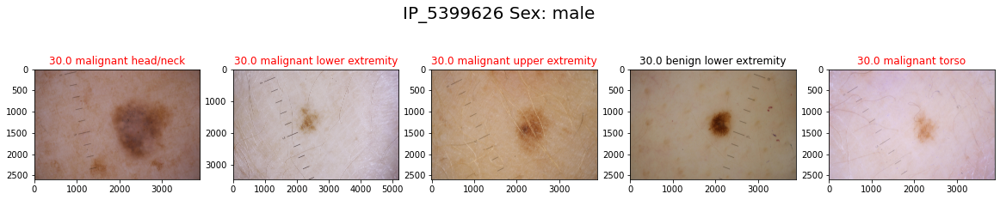

In [35]:
for patient_id in np.random.choice(trainMeta[trainMeta.target==1].fillna("NA").patient_id.unique(),size=1,replace=False):
    x = trainMeta[trainMeta.patient_id == patient_id].sort_values(['age_approx','image_name'])
    
    r, c = int(np.ceil(x.shape[0]/5)), 5
    
    fig, ax = plt.subplots(r,c, figsize=(20,4*r))
    
    fig = fig.suptitle(f'{patient_id} Sex: {x.sex.values[0]}',fontsize=20)
    
    for i, image_name in enumerate(x.image_name.values):
        img = cv2.imread(DATA_PATH + f'jpeg/train/{image_name}.jpg')
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        
        if x.benign_malignant.values[i] == "malignant":
            color = "red"
        else:
            color = "black"
        
        if r>1:
            ax[i//5,i%5].imshow(img)
            ax[i//5,i%5].set_title(f"{x.age_approx.values[i]} {x.benign_malignant.values[i]} {x.anatom_site_general_challenge.values[i]}",color=color)
        else:
            ax[i%5].imshow(img)
            ax[i%5].set_title(f"{x.age_approx.values[i]} {x.benign_malignant.values[i]} {x.anatom_site_general_challenge.values[i]}",color=color)
    
    plt.savefig(f'{x.target.sum()}_{patient_id}_{x.sex.values[0]}.png')

plt.show()

#### Images of a random Patient without Melanoma from the train-data

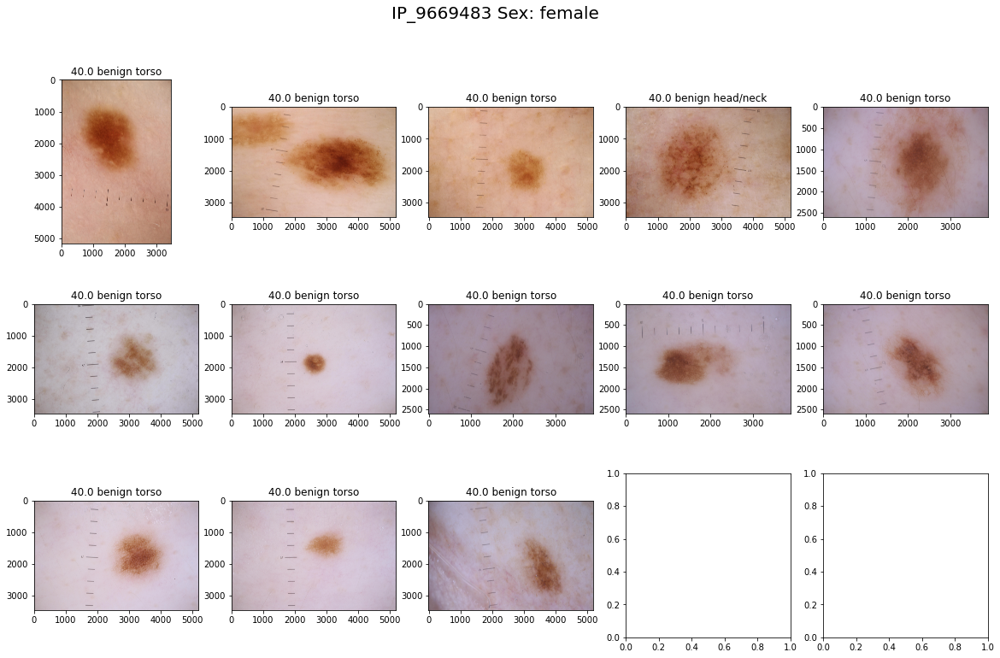

In [36]:
for patient_id in np.random.choice(trainMeta[trainMeta.target==0].fillna("NA").patient_id.unique(),size=1,replace=False):
    x = trainMeta[trainMeta.patient_id == patient_id].sort_values(['age_approx','image_name'])
    
    r, c = int(np.ceil(x.shape[0]/5)), 5
    
    fig, ax = plt.subplots(r,c, figsize=(20,4*r))
    
    fig = fig.suptitle(f'{patient_id} Sex: {x.sex.values[0]}',fontsize=20)
    
    for i, image_name in enumerate(x.image_name.values):
        img = cv2.imread(DATA_PATH + f'jpeg/train/{image_name}.jpg')
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        
        if x.benign_malignant.values[i] == "malignant":
            color = "red"
        else:
            color = "black"
        
        if r>1:
            ax[i//5,i%5].imshow(img)
            ax[i//5,i%5].set_title(f"{x.age_approx.values[i]} {x.benign_malignant.values[i]} {x.anatom_site_general_challenge.values[i]}",color=color)
        else:
            ax[i%5].imshow(img)
            ax[i%5].set_title(f"{x.age_approx.values[i]} {x.benign_malignant.values[i]} {x.anatom_site_general_challenge.values[i]}",color=color)
    
    plt.savefig(f'{x.target.sum()}_{patient_id}_{x.sex.values[0]}.png')

plt.show()

#### Images of a random Patient from the test-data

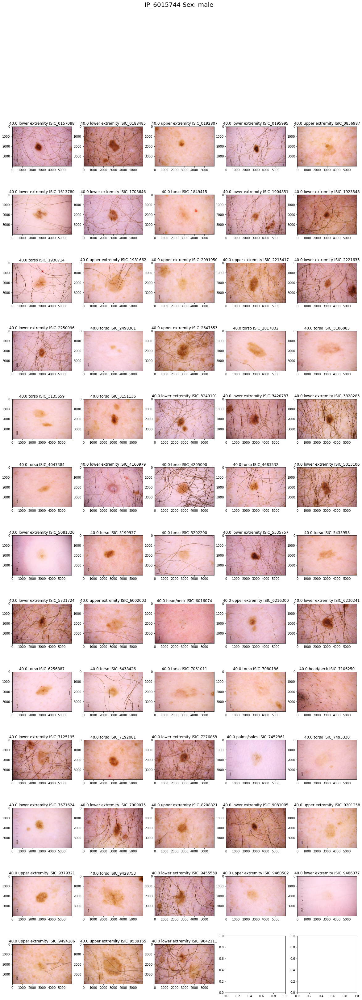

In [37]:
for patient_id in np.random.choice(testMeta.fillna("NA").patient_id.unique(),size=1,replace=False):
    x = testMeta[testMeta.patient_id == patient_id].sort_values(['age_approx','image_name'])
    
    r, c = int(np.ceil(x.shape[0]/5)), 5
    
    fig, ax = plt.subplots(r,c, figsize=(20,4*r))
    
    fig = fig.suptitle(f'{patient_id} Sex: {x.sex.values[0]}',fontsize=20)
    
    for i, image_name in enumerate(x.image_name.values):
        img = cv2.imread(DATA_PATH + f'jpeg/test/{image_name}.jpg')
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        
        if r>1:
            ax[i//5,i%5].imshow(img)
            ax[i//5,i%5].set_title(f"{x.age_approx.values[i]} {x.anatom_site_general_challenge.values[i]} {image_name}")
        else:
            ax[i%5].imshow(img)
            ax[i%5].set_title(f"{x.age_approx.values[i]} {x.anatom_site_general_challenge.values[i]} {image_name}")
    
#     plt.savefig(f'{x.target.sum()}_{patient_id}_{x.sex.values[0]}.png')

plt.show()

## 4. Data Augmentation

### Sample Image

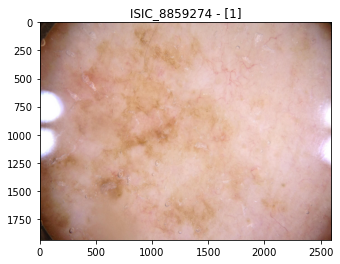

In [38]:
image_folder_path = '../input/siim-isic-melanoma-classification/jpeg/train/'
imageName = np.random.choice(trainMeta[trainMeta.target==1].image_name.values)
sampleImage = cv2.imread(os.path.join(image_folder_path, f'{imageName}.jpg'))[:,:,::-1]
plt.title(f'{imageName} - {trainMeta[trainMeta.image_name==imageName].target.values}')
plt.imshow(sampleImage)

### Random Augmentations

In [39]:
transforms = ['Identity','RandomBrightness','RandomContrast','Crop','FlipLeftRight','FlipUpDown','RandomSaturation','Rot90','Rot180','Rot270']

def randAugment(image=sampleImage,N=3):
    
    augmentations = np.random.choice(transforms,N,replace=False)
    
    image = tf.cast(image, tf.float32) / 255.0
    
    for transform in augmentations:

        if transform=='Identity':
            continue

        elif transform=='RandomBrightness':
            image = tf.image.random_brightness(image,max_delta=0.2)
        
        elif transform=='RandomContrast':
            image = tf.image.random_contrast(image,1.0,3.0)
        
        elif transform=='Crop':
#             image = tf.image.random_crop(image,[512,512,3])
            image = tf.image.central_crop(image,0.5)
    
        elif transform=='FlipLeftRight':
            image = tf.image.flip_left_right(image)
            
        elif transform=='FlipUpDown':
            image = tf.image.flip_up_down(image)
        
        elif transform=='RandomSaturation':
            image = tf.image.random_saturation(image,0.6,1.5)
        
        elif transform=='Rot90':
            image = tf.image.rot90(image,k=1)
        
        elif transform=='Rot180':
            image = tf.image.rot90(image,k=2)
            
        elif transform=='Rot270':
            image = tf.image.rot90(image,k=3)
        
    image = tf.image.resize(image,(450,600))
#     image = cv2.resize(image.numpy(),(600,450))
#     print(np.all(image1.numpy()==image1))
        
    return image, augmentations

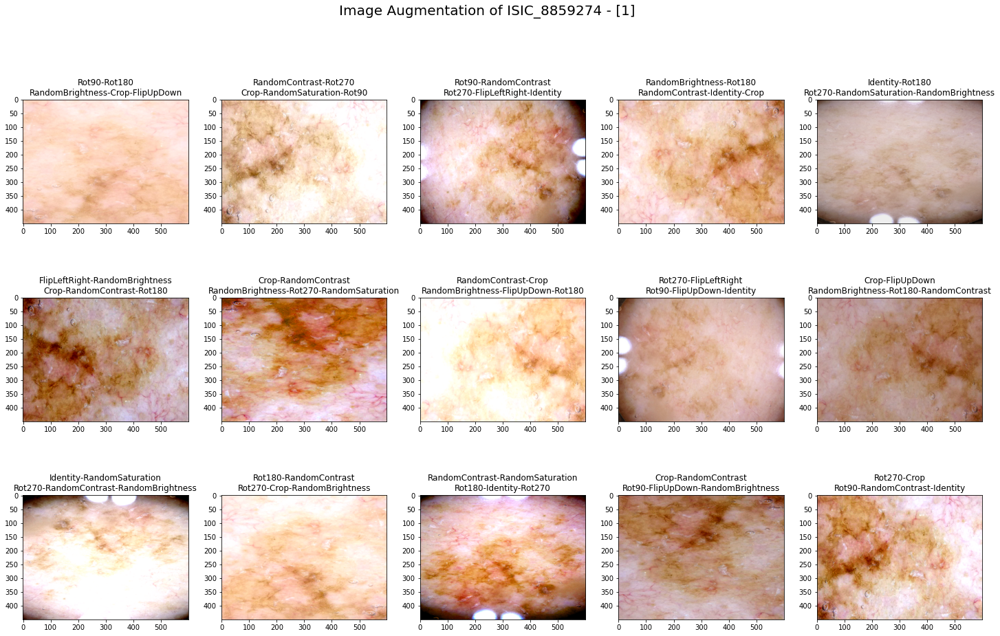

In [40]:
r, c = 3, 5

fig, ax = plt.subplots(r,c, figsize=(25,5*r))

fig = fig.suptitle(f"Image Augmentation of {imageName} - {trainMeta[trainMeta.image_name==imageName].target.values}",fontsize=20)

for i in range(r*c):
    img, augmentations = randAugment(sampleImage,5)

    ax[i//5,i%5].imshow(img)
    ax[i//5,i%5].set_title("-".join(augmentations[:2]) + "\n" + "-".join(augmentations[2:]))

#     plt.savefig(f'{x.target.sum()}_{patient_id}_{x.sex.values[0]}.png')

plt.show()

## 5. Validation Strategy - Stratified Group K-Fold
https://www.kaggle.com/jakubwasikowski/stratified-group-k-fold-cross-validation

In [41]:
def stratified_group_k_fold(X, y, groups, k, seed=None):
    labels_num = np.max(y) + 1
    y_counts_per_group = defaultdict(lambda: np.zeros(labels_num))
    y_distr = Counter()
    for label, g in zip(y, groups):
        y_counts_per_group[g][label] += 1
        y_distr[label] += 1

    y_counts_per_fold = defaultdict(lambda: np.zeros(labels_num))
    groups_per_fold = defaultdict(set)

    def eval_y_counts_per_fold(y_counts, fold):
        y_counts_per_fold[fold] += y_counts
        std_per_label = []
        for label in range(labels_num):
            label_std = np.std([y_counts_per_fold[i][label] / y_distr[label] for i in range(k)])
            std_per_label.append(label_std)
        y_counts_per_fold[fold] -= y_counts
        return np.mean(std_per_label)
    
    groups_and_y_counts = list(y_counts_per_group.items())
    random.Random(seed).shuffle(groups_and_y_counts)

    for g, y_counts in sorted(groups_and_y_counts, key=lambda x: -np.std(x[1])):
        best_fold = None
        min_eval = None
        for i in range(k):
            fold_eval = eval_y_counts_per_fold(y_counts, i)
            if min_eval is None or fold_eval < min_eval:
                min_eval = fold_eval
                best_fold = i
        y_counts_per_fold[best_fold] += y_counts
        groups_per_fold[best_fold].add(g)

    all_groups = set(groups)
    
    for i in range(k):
        train_groups = all_groups - groups_per_fold[i]
        test_groups = groups_per_fold[i]

        train_indices = [i for i, g in enumerate(groups) if g in train_groups]
        test_indices = [i for i, g in enumerate(groups) if g in test_groups]

        yield train_indices, test_indices

In [42]:
def get_stratify_group(row):
    stratify_group = row['sex']
#     stratify_group += f'_{row["age_approx"]}'
    stratify_group += f'_{row["anatom_site_general_challenge"]}'
    stratify_group += f'_{row["target"]}'
    return stratify_group

In [43]:
%%time

train = trainMeta.copy()
train['stratify_group'] = train.fillna("NA").apply(get_stratify_group, axis=1)
train['stratify_group'] = train['stratify_group'].astype('category').cat.codes

train['fold'] = 0

k = 5
for fold_ind, (train_ind, val_ind) in enumerate(stratified_group_k_fold(trainMeta, train.stratify_group.values, trainMeta.patient_id.values, k=k, seed=SEED)):
    train.loc[val_ind,'fold'] = fold_ind

train.fold.value_counts(normalize=True)

CPU times: user 24.4 s, sys: 8.6 ms, total: 24.4 s
Wall time: 24.4 s


0    0.202500
1    0.199813
3    0.199269
4    0.199239
2    0.199179
Name: fold, dtype: float64

In [44]:
for i in range(5):
    for j in range(i+1,5):
        print(f"fold_{i} intersection fold_{j}: {set(train[train.fold==i].patient_id).intersection(set(train[train.fold==j].patient_id))}")

fold_0 intersection fold_1: set()
fold_0 intersection fold_2: set()
fold_0 intersection fold_3: set()
fold_0 intersection fold_4: set()
fold_1 intersection fold_2: set()
fold_1 intersection fold_3: set()
fold_1 intersection fold_4: set()
fold_2 intersection fold_3: set()
fold_2 intersection fold_4: set()
fold_3 intersection fold_4: set()


In [45]:
fig = px.histogram(train.fillna("NA"), x="benign_malignant", y="target",color='fold',barmode="group",title="Distribution of Targets wrt to Folds")
fig.show()

In [46]:
fig = px.histogram(train.fillna("NA"), x="anatom_site_general_challenge", y="anatom_site_general_challenge",color='fold',barmode="group",title="Distribution of Anatom-site wrt folds")
fig.show()

In [47]:
fig = px.histogram(train.fillna("NA"), x="sex", y="sex",color='fold',barmode="group",title="Distribution of Sex wrt folds")
fig.show()

In [48]:
fig = px.histogram(train.fillna("NA"), x="age_approx", y="age_approx",color='fold',barmode="group",title="Distribution of Age wrt folds")
fig.show()

In [49]:
train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,stratify_group,fold
0,ISIC_2637011,IP_7279968,male,45.0,head/neck,unknown,benign,0,20,2
1,ISIC_0015719,IP_3075186,female,45.0,upper extremity,unknown,benign,0,16,1
2,ISIC_0052212,IP_2842074,female,50.0,lower extremity,nevus,benign,0,8,0
3,ISIC_0068279,IP_6890425,female,45.0,head/neck,unknown,benign,0,6,0
4,ISIC_0074268,IP_8723313,female,55.0,upper extremity,unknown,benign,0,16,1


In [50]:
# train.to_csv('train_StratifiedGroupK(5)Fold(SEED2020)(Group_sex_anatomsite_target).csv',index=False)

## 6. Base Model using Meta-data

In [51]:
y = train.target
folds = train.fold
X = train.drop(['target','benign_malignant','diagnosis','stratify_group','fold','image_name'],axis=1)
X.head()

,patient_id,sex,age_approx,anatom_site_general_challenge
0,IP_7279968,male,45.0,head/neck
1,IP_3075186,female,45.0,upper extremity
2,IP_2842074,female,50.0,lower extremity
3,IP_6890425,female,45.0,head/neck
4,IP_8723313,female,55.0,upper extremity


In [52]:
X.sex = X.sex.fillna("unknown")
X.anatom_site_general_challenge = X.anatom_site_general_challenge.fillna("unknown")
X.age_approx = X.age_approx.fillna(0)

X_test = testMeta.copy()
X_test.anatom_site_general_challenge = X_test.anatom_site_general_challenge.fillna("unknown")

In [53]:
def labelEncoder(train,val,test,columns):
    for col in columns:
        le = LabelEncoder()    
        train[f'le_{col}'] = le.fit_transform(train[col])
        val[f'le_{col}'] = le.transform(val[col])
        test[f'le_{col}'] = le.transform(test[col])
    
    return train,val,test

def oneHotEncode(train,val,test,cols):
    train['temp'] = 0
    val['temp'] = 1
    test['temp'] = 2
    
    temp = pd.get_dummies(pd.concat([train,val,test],axis=0),columns=cols,drop_first=True)
    
    train = temp[temp.temp==0]
    val = temp[temp.temp==1]
    test = temp[temp.temp==2]
    
    train.drop(['temp'],inplace=True,axis=1)
    val.drop(['temp'],inplace=True,axis=1)
    test.drop(['temp'],inplace=True,axis=1)
    
    return train, val, test


def standardScale(X_train,X_val,test,cols):
    
    for col in cols:
        ss = StandardScaler()
        X_train[f'std_{col}'] = ss.fit_transform(X_train[col].values.reshape(-1,1))
        X_val[f'std_{col}'] = ss.transform(X_val[col].values.reshape(-1,1))
        test[f'std_{col}'] = ss.transform(test[col].values.reshape(-1,1))

    return X_train, X_val, test


def targetEncode(X_train,y_train,X_val,X_test,cols):
    
    X = pd.concat([X_train,y_train],axis=1)
    
    alpha = 15
    global_mean = y_train.mean()
    
    for col in cols:
        encodings = dict((X.groupby([col])['target'].sum() + alpha*global_mean)/(alpha + X.groupby([col])['target'].count()))
        X_train[f'te_{col}'] = X_train[col].map(encodings).fillna(global_mean)
        X_val[f'te_{col}'] = X_val[col].map(encodings).fillna(global_mean)
        X_test[f'te_{col}'] = X_test[col].map(encodings).fillna(global_mean)
    
    return X_train, X_val, X_test


def featureInteractions(X_train,X_val,X_test,cols):
    
    for i in range(len(cols)):
        for j in range(i+1,len(cols)):
            X_train[f'{cols[i]}_{cols[j]}'] = f'{X_train[cols[i]]}_{X_train[cols[j]]}'
            X_val[f'{cols[i]}_{cols[j]}'] = f'{X_val[cols[i]]}_{X_val[cols[j]]}'
            X_test[f'{cols[i]}_{cols[j]}'] = f'{X_test[cols[i]]}_{X_test[cols[j]]}'
    
    return X_train, X_val, X_test
    
    
    
def preprocessData(X_train,y_train,X_val,X_test):
    
    data = [X_train,X_val,X_test]
    
    # Sun-Exposed or not feature
#     for X in data:
#         X['sun_exposed'] = X.anatom_site_general_challenge.map({'torso':1,'lower extremity':2,'upper extremity':2,'head/neck':3,'unknown':0,'palms/soles':0,'oral/genital':0})
    
    # Feature Interactions
#     X_train, X_val, X_test = featureInteractions(X_train,X_val,X_test,['sex','age_approx','anatom_site_general_challenge'])
#     X_train["_".join(['sex','age_approx','anatom_site_general_challenge'])] = f'{X_train["sex"]}_{X_train["age_approx"]}_{X_train["anatom_site_general_challenge"]}'
#     X_val["_".join(['sex','age_approx','anatom_site_general_challenge'])] = f'{X_val["sex"]}_{X_val["age_approx"]}_{X_val["anatom_site_general_challenge"]}'
#     X_test["_".join(['sex','age_approx','anatom_site_general_challenge'])] = f'{X_test["sex"]}_{X_test["age_approx"]}_{X_test["anatom_site_general_challenge"]}'

    
    
    X_train, X_val, X_test = standardScale(X_train,X_val,X_test,['age_approx'])
    
    
#     X_train,X_val,X_test = labelEncoder(X_train,X_val,X_test,['sex','age_approx','anatom_site_general_challenge'])
#     X_train, X_val, X_test = targetEncode(X_train,y_train,X_val,X_test,
#                                           [col for col in ['sex','age_approx','anatom_site_general_challenge','sex_age_approx','sex_anatom_site_general_challenge','age_approx_anatom_site_general_challenge',"_".join(['sex','age_approx','anatom_site_general_challenge'])] if col in X_train.columns])
    X_train, X_val, X_test = oneHotEncode(X_train,X_val,X_test,cols=[col for col in ['anatom_site_general_challenge','sex','sex_age_approx','sex_anatom_site_general_challenge','age_approx_anatom_site_general_challenge'] if col in X_train.columns])
    
    
    # Drop unwanted columns
    dropCols = list(X_train.dtypes[X_train.dtypes=='object'].index.values) + ['age_approx']
    X_train = X_train.drop(dropCols,axis=1)
    X_val = X_val.drop(dropCols,axis=1)
    X_test = X_test.drop(dropCols,axis=1)
        
#     print(X_train.columns)
    
    return X_train, X_val, X_test

### Training

In [54]:
def trainOnMetaData(X,y,X_test,folds):
    
    CVScores = []
    
    valPred = y.copy()
    
    testPred = {}
    
    for fold in range(k):
        val_idx = X[folds==fold].index
        train_idx = X[folds!=fold].index
        
        X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]
        X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
        test = X_test[X_train.columns].copy()
        
        # Preprocessing
        X_train, X_val, test = preprocessData(X_train,y_train,X_val,test)
            
        model = LogisticRegression(n_jobs=-1,random_state=SEED,max_iter=100)
        
        model.fit(X_train,y_train)
        
        print(f'\nFold {fold}: ')
        print('----------------')
        
        valPred.iloc[val_idx] = model.predict_proba(X_val)[:,1]
        
        valScore = roc_auc_score(y_val,valPred.iloc[val_idx])
        print("Validation Score: ",valScore)
        CVScores.append(valScore)
        
        print("\nCoeff: ",dict(zip(X_train.columns,model.coef_[0])))
#         print("\nFeature Importance: ",dict(zip(X_train.columns,model.feature_importances_)))
        
        testPred[f'fold_{fold}'] = model.predict_proba(test)[:,1]
    
    print(f"\nMean CV Score: {np.mean(CVScores)} +/- {np.std(CVScores)}")
    
    return CVScores, valPred, pd.DataFrame(testPred)

In [55]:
CVScores, valPred, testPred = trainOnMetaData(X,y,X_test,folds)


Fold 0: 
----------------
Validation Score:  0.7000372932794939

Coeff:  {'std_age_approx': 0.6271020531689818, 'anatom_site_general_challenge_lower extremity': -0.8006668589818337, 'anatom_site_general_challenge_oral/genital': 0.15359295679329857, 'anatom_site_general_challenge_palms/soles': -0.5527943545016156, 'anatom_site_general_challenge_torso': -0.7684120802967198, 'anatom_site_general_challenge_unknown': -0.27734195394937095, 'anatom_site_general_challenge_upper extremity': -0.3402480402081211, 'sex_male': 0.3434865759690179, 'sex_unknown': -0.015204197960420123}

Fold 1: 
----------------
Validation Score:  0.6940237980687074

Coeff:  {'std_age_approx': 0.6300206021433994, 'anatom_site_general_challenge_lower extremity': -0.7881410575339727, 'anatom_site_general_challenge_oral/genital': 0.30916364878385894, 'anatom_site_general_challenge_palms/soles': -0.7590164362380132, 'anatom_site_general_challenge_torso': -0.7533801607650848, 'anatom_site_general_challenge_unknown': -0.4

## 7. Inference

In [56]:
def visualizeResults(CVScores,valPred,testPred):
    
    fig, ax = plt.subplots(1,3,figsize=(18,5))
    fig.suptitle("Results",fontsize=20)
    
    sns.barplot(x=list(range(k)),y=CVScores, ax=ax[0])
    ax[0].set_title(f"CV-Scores of {k}-Folds")
    
    sns.kdeplot(testPred.mean(axis=1),shade=True,ax=ax[1])
    ax[1].set_title("Distribution of Testset Predictions")
    
    sns.kdeplot(valPred[y==0],label='benign',shade=True,ax=ax[2])
    sns.kdeplot(valPred[y==1],label='malignant',shade=True,ax=ax[2])
    ax[2].set_title('Distribution of Cross-Validation set Predictions')

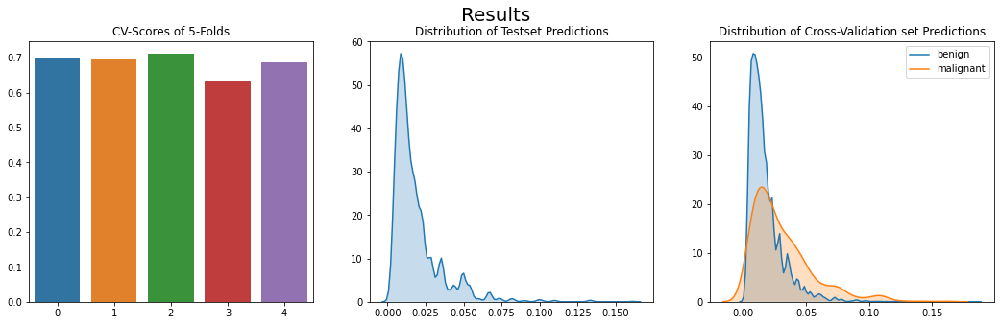

In [57]:
visualizeResults(CVScores,valPred,testPred)

In [58]:
hist_data = [valPred[folds==fold] for fold in range(k)]
group_labels = [f'fold_{fold}' for fold in range(k)]

fig = ff.create_distplot(hist_data, group_labels, show_hist=False).update_layout(title='Distribution of Cross Validation Set Predictions wrt of folds')
fig.show()

In [59]:
def saveResults(valPred,testPred,CVScores,modelName):
    
    sampleSubmission.iloc[:,1] = testPred.mean(axis=1)
    sampleSubmission.to_csv(f'{date.today()}_Test_{modelName}_{np.mean(CVScores)}.csv',index=False)
    
    val = pd.DataFrame(train['image_name']) 
    val['target'] = valPred

    val.to_csv(f'{date.today()}_Val_{modelName}_{np.mean(CVScores)}.csv',index=False)

In [60]:
saveResults(valPred,testPred,CVScores,'LogisticRegression')
os.listdir('/kaggle/working/')

['4_IP_5399626_male.png',
 '0_IP_9669483_female.png',
 '2020-06-20_Test_LogisticRegression_0.684946489700843.csv',
 '__notebook__.ipynb',
 '2020-06-20_Val_LogisticRegression_0.684946489700843.csv']

<font color="red" size=5> Please!!! Upvote this kernel if you find it useful. </font>